# Understanding COVID-19 Pandemic

#### Import data

In [1]:
# import pandas and numpy
import pandas as pd
import numpy as np

# read different data files (.csv)
# 1. cumulative counts of confirmed COVID-19 cases and deaths (source: https://usafacts.org)
cumul_case_data = pd.read_csv('./data/covid_cases.csv',dtype = {'countyFIPS': np.str})
cumul_death_data = pd.read_csv('./data/covid_deaths.csv',dtype = {'countyFIPS': np.str})
# 2. population data (source: source: https://usafacts.org)
county_population = pd.read_csv('./data/county_population.csv',dtype = {'countyFIPS': np.str})
# 3. poverty data (source: https://data.ers.usda.gov/)
county_poverty = pd.read_csv('./data/poverty_data.csv',dtype = {'countyFIPS': np.str})
# 4. surface areas for different counties (source: www.census.gov)
county_sa = pd.read_csv('./data/county_surfacearea.csv',dtype = {'countyFIPS': np.str})
# 5. mask use- limited to a national survey in July 2020 (source: https://github.com/nytimes/covid-19-data)
county_maskuse = pd.read_csv('./data/mask_use.csv',dtype = {'countyFIPS': np.str})
# 6. county demographics (source: https://github.com/OpenIntroStat/openintro)
county_demographics = pd.read_csv('./data/county_demographic.csv',dtype = {'countyFIPS': np.str})
# 7. Health data (source: https://www.countyhealthrankings.org/)
county_health = pd.read_csv('./data/health.csv',dtype = {'countyFIPS': np.str})

#### Initial data preparation steps

In [2]:
# remove extra space at the end of the county names in case and death data files
cumul_case_data['County Name'] = cumul_case_data['County Name'].apply(lambda x: x.rstrip())
cumul_death_data['County Name'] = cumul_death_data['County Name'].apply(lambda x: x.rstrip())
# create a dataframe representing social determinant of health as well as other miscellaneous variable
covid_ev = cumul_case_data[['countyFIPS','County Name','State']]

# merge datasets
# create a function for merging datasets
def mergeMyData(x,y,selected_columns):
    # clean the countyFIPS column on y dataframe
    y['countyFIPS'] = y['countyFIPS'].apply(lambda x: x.lstrip('0'))
    # merge the two datasets
    merged_data = pd.merge(x,y,how = 'left',on = selected_columns)
    return merged_data

# population data
covid_ev = mergeMyData(x = covid_ev,y = county_population, selected_columns = ['countyFIPS'])
# county land surface areas
covid_ev = mergeMyData(x = covid_ev,y = county_sa,selected_columns = ['countyFIPS'])
# poverty data
covid_ev = mergeMyData(x = covid_ev,y = county_poverty,selected_columns = ['countyFIPS'])
# mask use
covid_ev = mergeMyData(x = covid_ev,y = county_maskuse,selected_columns = ['countyFIPS'])
# demographics
covid_ev = mergeMyData(x = covid_ev,y = county_demographics,selected_columns = ['countyFIPS'])
# health data
covid_ev = mergeMyData(x = covid_ev,y = county_health,selected_columns = ['countyFIPS'])


# adjust selected fields
# 1. add population desnity field (Population/SQM)
covid_ev['Population Density'] = round(covid_ev['Population']/covid_ev['SQM'],2)
# 2. convert number of uninsured to uninsured rate per 100K residents
covid_ev['Uninsured Rate per 100K'] = round(covid_ev['# Uninsured'] * 1E5 / covid_ev['Population'],2)
# 3. convert age 65+ to age 65+ per 100K residents
covid_ev['Age 65+'] = covid_ev['age_over_65']
# 4. convert demographics data from general percentage to percentage per 100K residents
covid_ev['Black per 100K'] = covid_ev['black']
covid_ev['Hispanic per 100K'] = covid_ev['hispanic']
covid_ev['White per 100K'] = covid_ev['white_not_hispanic']
# 5. convert % Fair or Poor Health to rate per 100K residents
covid_ev['% Fair/Poor Health per 100K'] = covid_ev['% Fair or Poor Health']
# 6. convert % Adults with obesity to rate per 100K residents
covid_ev['% Adults with Obesity per 100K'] = covid_ev['% Adults with Obesity']
# 7. convert % Physically Inactive to rate per 100K residents
covid_ev['% Physically Inactive per 100K'] = covid_ev['% Physically Inactive']
# 8. convert % With Access to Execercise Opportunities rate per 100K residents
covid_ev['% Access to Exercise per 100K'] = covid_ev['% With Access to Exercise Opportunities']
# 9. convert % Excessive Drinking to rate per 100K residents
covid_ev['% Excessive Drinking per 100K'] = covid_ev['% Excessive Drinking']
# 10. convert % Smoking to rate per 100K residents
covid_ev['% Smokers per 100K'] = covid_ev['% Smokers']

# drop selected columns
selected_columns = ['SQM','# Uninsured','age_over_65','black','hispanic','white_not_hispanic','% Fair or Poor Health','% Adults with Obesity','% Physically Inactive','% With Access to Exercise Opportunities','% Smokers','% Excessive Drinking']
covid_ev.drop(selected_columns,axis = 1, inplace = True)
covid_ev.columns

Index(['countyFIPS', 'County Name', 'State', 'Population', 'Rural Urban Code',
       'Urban Influence Code', 'Poverty', 'mask_never', 'mask_rarely',
       'mask_sometimes', 'mask_frequently', 'mask_always',
       'Number of Physically Unhealthy Days per month',
       'Number of Mentally Unhealthy Days per month', 'Food Environment Index',
       '# Primary Care per 100K', 'Social Association Rate per 100K',
       'Violent Crime Rate per 100K', 'Average Daily PM2.5',
       'Population Density', 'Uninsured Rate per 100K', 'Age 65+',
       'Black per 100K', 'Hispanic per 100K', 'White per 100K',
       '% Fair/Poor Health per 100K', '% Adults with Obesity per 100K',
       '% Physically Inactive per 100K', '% Access to Exercise per 100K',
       '% Excessive Drinking per 100K', '% Smokers per 100K'],
      dtype='object')

In [3]:
# calculate total confirmed cases in United States by June 7, 2021
total_confirmed_cases = cumul_case_data.iloc[:,-1].sum()
# calculate total death in the United States by June 7, 2021
total_deaths = cumul_death_data.iloc[:,-1].sum()

In [4]:
# report summary data across the united states

 | Summary| Cases  |Deaths    |
|---:|:-------------|:-----------|
| Total reported | {{total_confirmed_cases}} | {{total_deaths}}      | 


In [5]:
total_case_data

NameError: name 'total_case_data' is not defined

In [6]:
# calculate daily confirmed cases and deaths in individual counties
# considering January 22, 2021 as t=0, daily numbers are calculated as daily_x(t) = total_x(t) - total_x(t-1)

daily_cases = cumul_case_data[['countyFIPS','County Name','State','2020-01-22']].copy()
daily_deaths = cumul_death_data[['countyFIPS','County Name','State','2020-01-22']].copy()
case_difference = cumul_case_data.iloc[:,4:].diff(axis = 1)
death_difference = cumul_death_data.iloc[:,4:].diff(axis = 1)
dates = case_difference.columns
column_index = len(daily_cases.columns)
dates
# daily cases and deaths
for date in dates[1:]:
    daily_cases.insert(column_index,date,case_difference[date].apply(lambda x: max(x,0)))
    daily_deaths.insert(column_index,date,death_difference[date].apply(lambda x: max(x,0)))
    column_index += 1

#### Visual Representations of COVID-19 Data

In [7]:
daily_cases.iloc[:,3:].head()

,2020-01-22,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,...,2021-05-29,2021-05-30,2021-05-31,2021-06-01,2021-06-02,2021-06-03,2021-06-04,2021-06-05,2021-06-06,2021-06-07
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8.0,11.0,11.0,14.0,0.0,0.0,20.0
1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,41.0,13.0,10.0,14.0,0.0,0.0,26.0
2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.0,3.0,3.0,0.0,0.0,0.0,1.0
3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,23.0,2.0,5.0,12.0,0.0,0.0,10.0


In [8]:
# create summary graphs for daily cases of confirmed cases as well as death in the United States including 7-day moving averages
# for interactive graphs
import plotly.graph_objects as go
from plotly.offline import iplot
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
%matplotlib inline

# daily total cases and deaths in US including 7-day moving averages across all available couties
us_daily_cases = daily_cases.iloc[:,3:].sum(axis = 0)
us_daily_cases_7a = us_daily_cases.rolling(axis = 0,window = 7).mean()
us_daily_deaths = daily_deaths.iloc[:,3:].sum(axis = 0)
us_daily_deaths_7a = us_daily_deaths.rolling(axis = 0,window = 7).mean()
# set up plotly figure subplots
fig = make_subplots(rows = 1,cols = 2,subplot_titles = ('US Daily confirmed cases', 'US Daily deaths'))
# create traces
fig.add_trace(go.Scatter(
    mode='lines',
    x = list(us_daily_cases_7a.index),
    y = us_daily_cases_7a,
    name = "7-day moving average cases",
    marker_color = 'red',legendgroup = '1'),
              row = 1,col = 1)
fig.add_trace(go.Bar(x = list(us_daily_cases.index),y = us_daily_cases,name="Daily cases",marker_color = 'orange',legendgroup = '1'),row = 1,col = 1)
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.add_trace(go.Scatter(mode='lines',x = list(us_daily_deaths_7a.index),y = us_daily_deaths_7a,name="7-day moving average deaths",marker_color='blue',legendgroup = '2'),row = 1,col = 2)
fig.add_trace(go.Bar(x = list(us_daily_deaths.index),y = us_daily_deaths,name="Daily deaths",marker_color = 'black',legendgroup = '2'),row = 1,col = 2)
fig.update_xaxes(title_text="Date", row=1, col=2)
fig.update_layout(
    height = 500,
    width = 1100,
    legend=dict(orientation="h",
                yanchor="top",
                y=1.5,
                xanchor="center",
                x=0.5))
iplot(fig)

### Hot spot analysis

Spatial distribution of total confirmed COVID-19 cases and deaths across united states per 100K residents

In [535]:
import plotly.express as px
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/python-visualization/folium/master/tests/us-counties.json') as response:
    counties = json.load(response)

# total cases per 100K residents 
# merge 'Population' to the datasets
df_case = mergeMyData(x = cumul_case_data,y = county_population, selected_columns = ['countyFIPS'])
df_death = mergeMyData(x = cumul_death_data,y = county_population, selected_columns = ['countyFIPS'])
cumul_cases_per100k = pd.DataFrame({
    'countyFIPS' : cumul_case_data['countyFIPS'],
    'County Name': cumul_case_data['County Name'],
    'State' : cumul_case_data['State'],
    'Total Cases/100K' : (round(df_case['2021-06-07'] * 1E5 / df_case['Population'],0))
})
# total deaths per 100k residents
cumul_deaths_per100k = pd.DataFrame({
    'countyFIPS' : cumul_death_data['countyFIPS'],
    'County Name': cumul_death_data['County Name'],
    'State' : total_death_data['State'],
    'Total Deaths/100K' : (round(df_death['2021-06-07'] * 1E5 / df_death['Population'],0))
})   
fig1 = px.choropleth(cumul_cases_per100k, 
                    geojson = counties, 
                    locations = 'countyFIPS', 
                    color = 'Total Cases/100K',     
                    color_continuous_scale = px.colors.sequential.Sunsetdark,
                    range_color = (0, 80000),
                    scope = "usa",
                    hover_data = {'State':True,'County Name':True,'Total Cases/100K':True,'countyFIPS':False}
                    )


fig1.update_layout(
             title_text = 'Total Confirmed Cases Per 100K Population')
fig1.show()
fig2 = px.choropleth(cumul_deaths_per100k, 
                    geojson = counties, 
                    locations = 'countyFIPS', 
                    color = 'Total Deaths/100K',     
                    color_continuous_scale = px.colors.sequential.Sunsetdark,
                    range_color = (0, 1000),
                    scope = "usa",
                    hover_data = {'State':True,'County Name':True,'Total Deaths/100K':True,'countyFIPS':False}
                    )


fig2.update_layout(
             title_text = 'Total Deaths Per 100K Population')
fig2.show()

## Explanatory analysis

Evaluating potential visual relationships between explanatory variables listed in covid_ev dataframe with cumulative confirmed cases of COVID-19 and deaths in the United States

In [565]:
cumul_cases_per100k = pd.DataFrame({
    'countyFIPS' : cumul_case_data['countyFIPS'],
    'County Name': cumul_case_data['County Name'],
    'State' : cumul_case_data['State'],
    'Total Cases/100K' : (round(df_case['2020-06-07'] * 1E5 / df_case['Population'],0))
})
cumul_cases_per100k

,countyFIPS,County Name,State,Total Cases/100K
0,1001,Autauga County,AL,474.0
1,1003,Baldwin County,AL,140.0
2,1005,Barbour County,AL,782.0
3,1007,Bibb County,AL,344.0
4,1009,Blount County,AL,125.0
...,...,...,...,...
3137,56037,Sweetwater County,WY,76.0
3138,56039,Teton County,WY,426.0
3139,56041,Uinta County,WY,114.0
3140,56043,Washakie County,WY,500.0


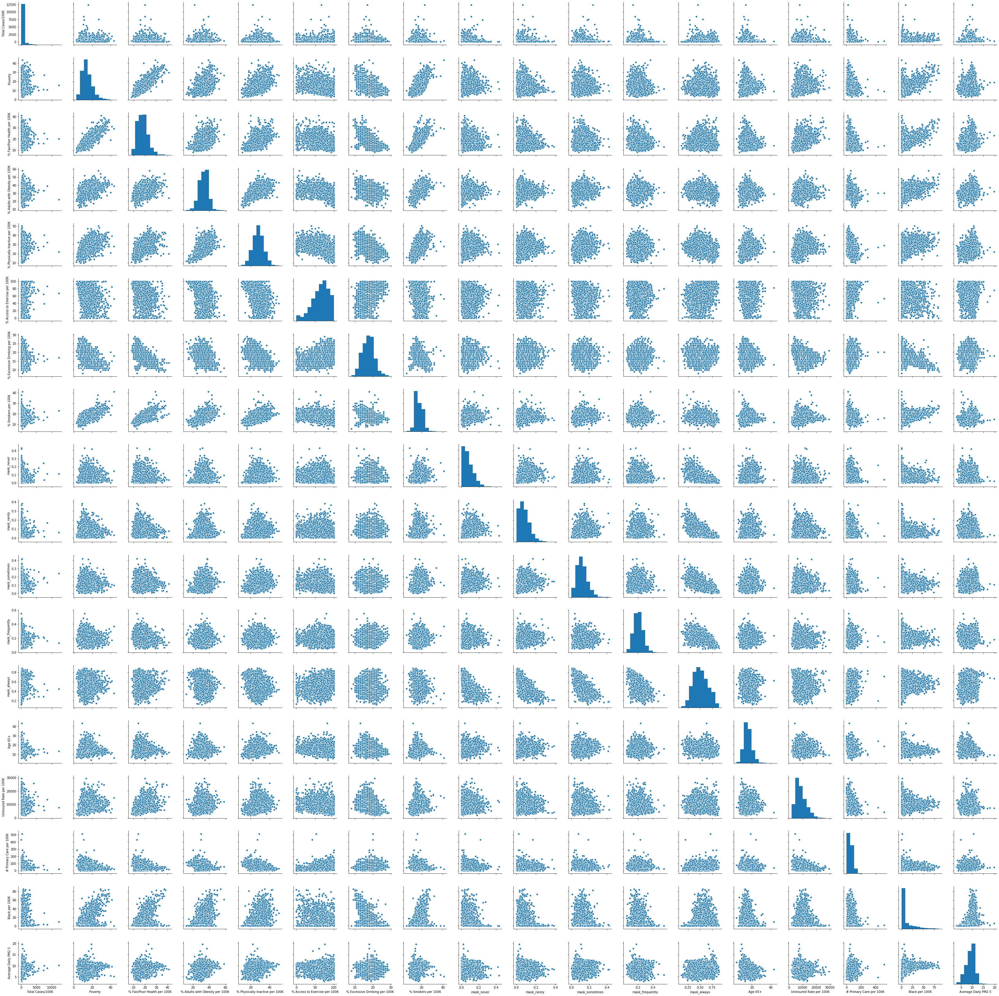

In [566]:
# potential data sources for each county: % population 65+, %uninsured, median household income, % white, black, asian, others
# create datasets combining covid_ev and cumul_cases_per100K and cumul_deaths_per100K
import seaborn as sns
import math

case_ev = pd.merge(cumul_cases_per100k,covid_ev,on = ['countyFIPS','County Name','State'], how = 'left')
death_ev= pd.merge(cumul_deaths_per100k,covid_ev,on = ['countyFIPS','County Name','State'], how = 'left')

# drop selected columns
case_ev.drop(['countyFIPS','County Name','State','Population'],axis = 1, inplace = True)
df = case_ev[['Total Cases/100K',
               'Poverty',
               '% Fair/Poor Health per 100K', 
               '% Adults with Obesity per 100K',
               '% Physically Inactive per 100K', 
               '% Access to Exercise per 100K',
               '% Excessive Drinking per 100K',
               '% Smokers per 100K',
               'mask_never','mask_rarely','mask_sometimes',
               'mask_frequently', 'mask_always',
               'Age 65+',
               'Uninsured Rate per 100K',
               '# Primary Care per 100K',
               'Black per 100K',
               'Average Daily PM2.5'
              ]]
df.dropna(inplace = True)
# generating pairplots
sns.pairplot(df)


In [567]:
df.corr()

,Total Cases/100K,Poverty,% Fair/Poor Health per 100K,% Adults with Obesity per 100K,% Physically Inactive per 100K,% Access to Exercise per 100K,% Excessive Drinking per 100K,% Smokers per 100K,mask_never,mask_rarely,mask_sometimes,mask_frequently,mask_always,Age 65+,Uninsured Rate per 100K,# Primary Care per 100K,Black per 100K,Average Daily PM2.5
Total Cases/100K,1.000000,0.108839,0.140309,0.033672,0.033804,0.048926,-0.060283,0.037827,-0.093295,-0.124568,-0.061559,-0.097399,0.145004,-0.215439,0.052102,0.014966,0.279549,0.096568
Poverty,0.108839,1.000000,0.812281,0.375770,0.483607,-0.355377,-0.528439,0.652469,0.095022,0.001737,0.062361,-0.080533,-0.028240,-0.015971,0.305316,-0.220311,0.509820,0.118742
% Fair/Poor Health per 100K,0.140309,0.812281,1.000000,0.426844,0.562269,-0.365047,-0.652447,0.729425,0.041790,-0.046964,0.054205,-0.105698,0.023456,-0.136081,0.427524,-0.295348,0.486870,0.293781
% Adults with Obesity per 100K,0.033672,0.375770,0.426844,1.000000,0.573220,-0.332571,-0.313405,0.499110,0.148872,0.121193,0.208493,0.062241,-0.207150,-0.022787,0.069766,-0.308809,0.317198,0.262816
% Physically Inactive per 100K,0.033804,0.483607,0.562269,0.573220,1.000000,-0.436355,-0.489466,0.572237,0.219665,0.185277,0.243976,0.038863,-0.262003,0.148730,0.247811,-0.371281,0.300481,0.272582
% Access to Exercise per 100K,0.048926,-0.355377,-0.365047,-0.332571,-0.436355,1.000000,0.373429,-0.339348,-0.228129,-0.209738,-0.241790,-0.052458,0.278901,-0.194087,-0.261695,0.436633,-0.180253,-0.053368
% Excessive Drinking per 100K,-0.060283,-0.528439,-0.652447,-0.313405,-0.489466,0.373429,1.000000,-0.444350,-0.093874,-0.012433,-0.100269,0.048511,0.059294,-0.145067,-0.360708,0.229561,-0.370698,-0.170441
% Smokers per 100K,0.037827,0.652469,0.729425,0.499110,0.572237,-0.339348,-0.444350,1.000000,0.215054,0.134925,0.215844,0.035663,-0.229563,-0.077204,0.075916,-0.264503,0.313660,0.329003
mask_never,-0.093295,0.095022,0.041790,0.148872,0.219665,-0.228129,-0.093874,0.215054,1.000000,0.425174,0.326894,0.043154,-0.682970,0.215198,0.076186,-0.121049,-0.132934,-0.134591
mask_rarely,-0.124568,0.001737,-0.046964,0.121193,0.185277,-0.209738,-0.012433,0.134925,0.425174,1.000000,0.367803,0.139267,-0.728023,0.200853,0.053453,-0.131588,-0.203424,-0.146486


In [510]:
case_ev.columns

Index(['Total Cases/100K', 'Rural Urban Code', 'Urban Influence Code',
       'Poverty', 'mask_never', 'mask_rarely', 'mask_sometimes',
       'mask_frequently', 'mask_always',
       'Number of Physically Unhealthy Days per month',
       'Number of Mentally Unhealthy Days per month', 'Food Environment Index',
       '# Primary Care per 100K', 'Social Association Rate per 100K',
       'Violent Crime Rate per 100K', 'Average Daily PM2.5',
       'Population Density', 'Uninsured Rate per 100K', 'Age 65+ per 100K',
       'Black per 100K', 'Hispanic per 100K', 'White per 100K',
       '% Fair/Poor Health per 100K', '% Adults with Obesity per 100K',
       '% Physically Inactive per 100K', '% Access to Exercise per 100K',
       '% Excessive Drinking per 100K', '% Smokers per 100K'],
      dtype='object')